## Loading of Stringer spontaneous data

includes some visualizations

In [1]:
# @title Install dependencies
!pip install umap-learn --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from umap import UMAP
from scipy.ndimage import uniform_filter1d
from scipy.stats import zscore
from sklearn.decomposition import PCA

In [3]:
# @title Figure settings
from matplotlib import rcParams

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] =15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

In [4]:
# @title Data retrieval
import os, requests

fname = "stringer_spontaneous.npy"
url = "https://osf.io/dpqaj/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [5]:
# @title Data loading

dat = np.load('stringer_spontaneous.npy', allow_pickle=True).item()
print(dat.keys())

dict_keys(['sresp', 'run', 'beh_svd_time', 'beh_svd_mask', 'stat', 'pupilArea', 'pupilCOM', 'xyz'])



dat has fields:
* `dat['sresp']`: neurons by timebins, a.k.a. the neural response data (11983 by 7018). Timebin = 1.2 sec.
* `dat['run']`: timebins by 1, a.k.a. the running speed of the animal in a.u.
* `dat['xyz']`: three-dimensional position of each neuron in the brain.
* `dat['pupilArea']`: timebins by 1, see FaceMap for details on the pupil tracker
* `dat['pupilCOM']`: timebins by 2, correspond to X and Y position. See FaceMap for details on the pupil tracker.
* `dat['beh_svd_time']`: timebins by 1,000. Timecourses of behavioral SVDs extracted from face movies. See FaceMap for details.
* `dat['beh_svd_mask']`: 240 by 320 by 1,000. Spatial masks of behavioral SVDs. Roughly normalized to each other.
* `dat['beh_svd_mask'] @ dat['beh_svd_time'][T, :]`:  reconstruction of the face movie (its motion energy) for frame T
* `dat['stat']`: 1 by neurons, some statistics for each neuron, see Suite2p for full documentation.

In [6]:
print(dat['beh_svd_time'].shape)
print(len(dat['stat']))

(7018, 1000)
11983


<ipython-input-7-749e88150ef0>:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')(xc)


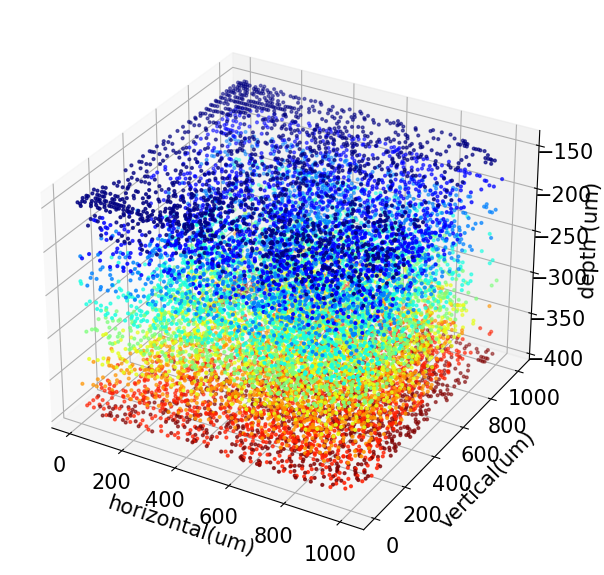

In [7]:
# @title plot the 3D positions of all neurons
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

x, y, z = dat['xyz']

zunq, iunq = np.unique(z, return_inverse=True)
xc = np.linspace(0.0, 1.0, len(zunq))
cmap = cm.get_cmap('jet')(xc)

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x[::-1],y[::-1], z[::-1], 'o', s=4, c=cmap[iunq])
ax.set(xlabel='horizontal(um)', ylabel='vertical(um)', zlabel='depth (um)')
plt.show()

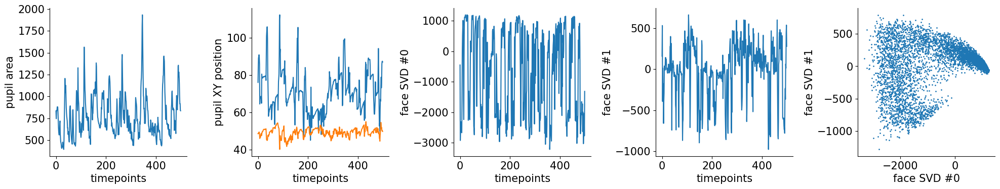

In [8]:
# @title Basic properties of behavioral data using plot and scatter
ax = plt.subplot(1, 5, 1)
plt.plot(dat['pupilArea'][:500, 0])
ax.set(xlabel='timepoints', ylabel='pupil area')

ax = plt.subplot(1, 5, 2)
plt.plot(dat['pupilCOM'][:500, :])
ax.set(xlabel='timepoints', ylabel='pupil XY position')

ax = plt.subplot(1, 5, 3)
plt.plot(dat['beh_svd_time'][:500, 0])
ax.set(xlabel='timepoints', ylabel='face SVD #0')

ax = plt.subplot(1, 5, 4)
plt.plot(dat['beh_svd_time'][:500, 1])
ax.set(xlabel='timepoints', ylabel='face SVD #1')

ax = plt.subplot(1, 5, 5)
plt.scatter(dat['beh_svd_time'][:, 0], dat['beh_svd_time'][:, 1], s=1)
ax.set(xlabel='face SVD #0', ylabel='face SVD #1')

plt.show()

In [9]:
# @title take PCA after preparing data by z-score

Z = zscore(dat['sresp'], axis=1)
Z = np.nan_to_num(Z)
X = PCA(n_components=200).fit_transform(Z)

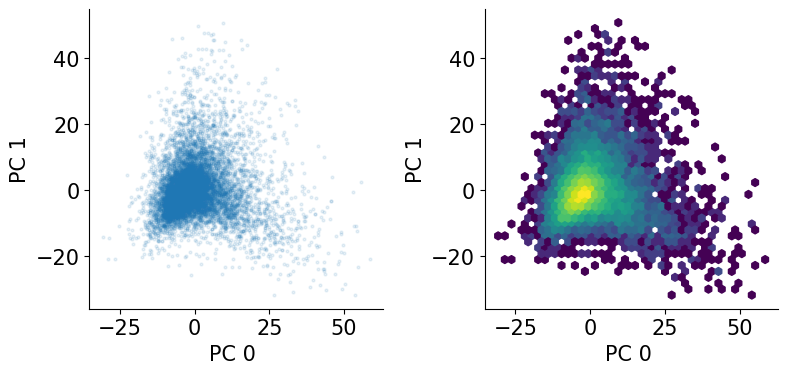

In [ ]:
# @title Plot PCs. Too many points, switch to logarithmic hexbin!
ax = plt.subplot(1, 5, 1)
plt.scatter(X[:, 0], X[:, 1], s=4, alpha=.1)
ax.set(xlabel='PC 0 ', ylabel='PC 1')

ax = plt.subplot(1, 5, 2)
plt.hexbin(X[:, 0], X[:, 1], gridsize=40, bins='log')
ax.set(xlabel='PC 0 ', ylabel='PC 1', alpha=.1)

plt.show()

(240, 320)


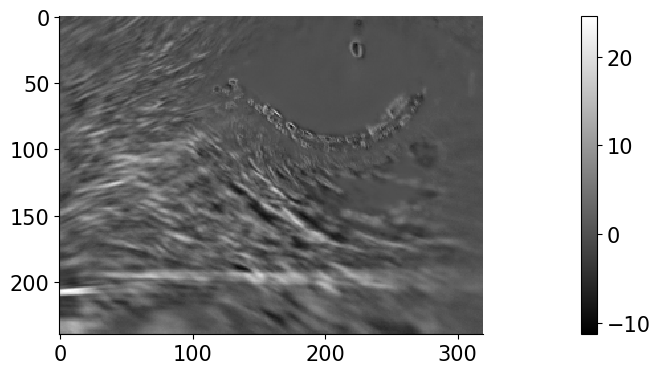

In [10]:
rec = dat['beh_svd_mask'] @ dat['beh_svd_time'][0, :]
print(rec.shape)

plt.imshow(rec, cmap='gray', interpolation='nearest')
# Adding color bar
plt.colorbar()
# Display the plot
plt.show()


In [11]:
# @title run a manifold embedding algorithm (UMAP) in two or three dimensions.

ncomp = 1 # try 2, then try 3
xinit = 1 * zscore(X[:, :ncomp], axis=0)
embed = UMAP(n_components=ncomp, init=xinit, n_neighbors=20,
             metric='correlation', transform_seed=42).fit_transform(X)

In [12]:
embed = embed.flatten()
isort = np.argsort(embed)
RasterMap = uniform_filter1d(Z[isort, :], size=50, axis=0)
RasterMap = zscore(RasterMap[::10, :], axis=1)

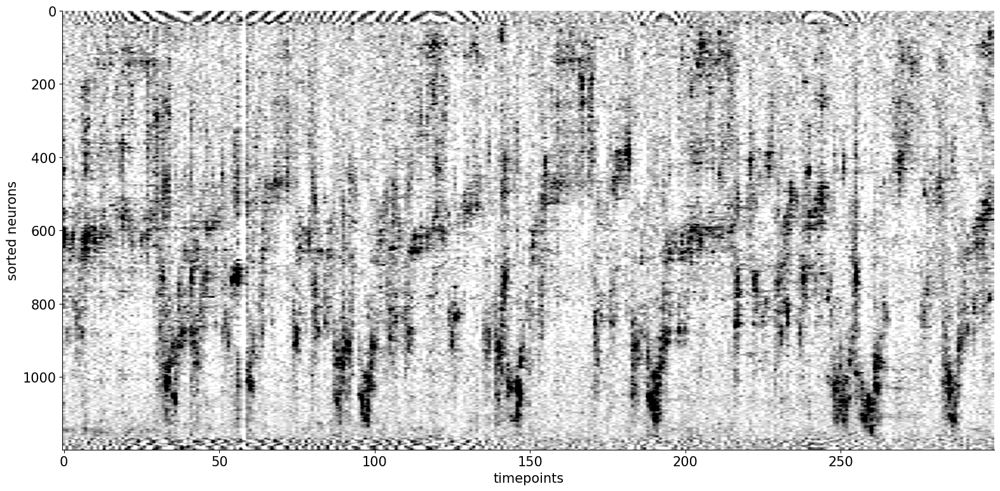

In [13]:
plt.figure(figsize=(16, 8))
ax = plt.subplot(111)
trange = np.arange(1100, 1400)
plt.imshow(RasterMap[:, trange], vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

In [48]:
neural_pc = RasterMap.T
motion_energy = dat['beh_svd_time'][:,:128]

print(neural_pc.shape)
print(motion_energy.shape)


(7018, 1199)
(7018, 128)


In [49]:

trange = np.arange(0, 5000)
y_train = neural_pc[trange,:]
x_train = motion_energy[trange,:]
trange = np.arange(5000, 7018)
y_test = neural_pc[trange,:]
x_test = motion_energy[trange,:]


print(y_train.shape)
print(y_test.shape)

(5000, 1199)
(2018, 1199)


In [22]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2

# Define the model
model = Sequential()
model.add(Dense(80, activation='relu', input_shape=(128,), kernel_regularizer=l2(0.01)))
model.add(Dropout(0.4))
model.add(Dense(100, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.6))
model.add(Dense(1199, activation='linear'))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Print the model summary
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 80)                10320     
                                                                 
 dropout_2 (Dropout)         (None, 80)                0         
                                                                 
 dense_4 (Dense)             (None, 100)               8100      
                                                                 
 dropout_3 (Dropout)         (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 1199)              121099    
                                                                 
Total params: 139519 (545.00 KB)
Trainable params: 139519 (545.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/50
125/125 [==============================] - 1s 7ms/step - loss: 1.5184 - val_loss: 1.6472
Epoch 2/50
125/125 [==============================] - 1s 6ms/step - loss: 1.4832 - val_loss: 1.6036
Epoch 3/50
125/125 [==============================] - 1s 6ms/step - loss: 1.4520 - val_loss: 1.5761
Epoch 4/50
125/125 [==============================] - 1s 6ms/step - loss: 1.4225 - val_loss: 1.5397
Epoch 5/50
125/125 [==============================] - 1s 6ms/step - loss: 1.3912 - val_loss: 1.5196
Epoch 6/50
125/125 [==============================] - 1s 6ms/step - loss: 1.3664 - val_loss: 1.4863
Epoch 7/50
125/125 [==============================] - 1s 8ms/step - loss: 1.3378 - val_loss: 1.4589
Epoch 8/50
125/125 [==============================] - 1s 9ms/step - loss: 1.3132 - val_loss: 1.4379
Epoch 9/50
125/125 [==============================] - 1s 9ms/step - loss: 1.2893 - val_loss: 1.4061
Epoch 10/50
125/125 [==============================] - 1s 6ms/step - loss: 1.2619 - val_loss: 1.3828

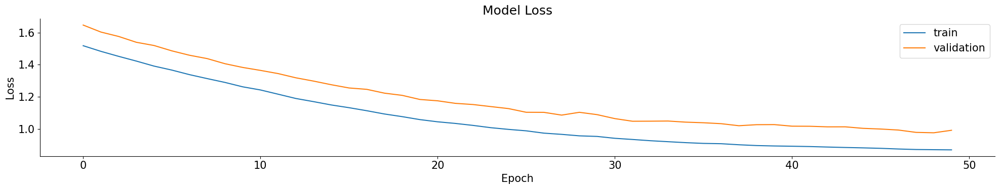

In [24]:
history = model.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=32)

# Plot the loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()



In [25]:
loss = model.evaluate(x_test, y_test)

# Print the metrics
print('Test Loss:', loss)


64/64 [==============================] - 0s 4ms/step - loss: 0.9561
Test Loss: 0.9561057686805725


In [26]:
y_pred = model.predict(x_test)

64/64 [==============================] - 0s 2ms/step


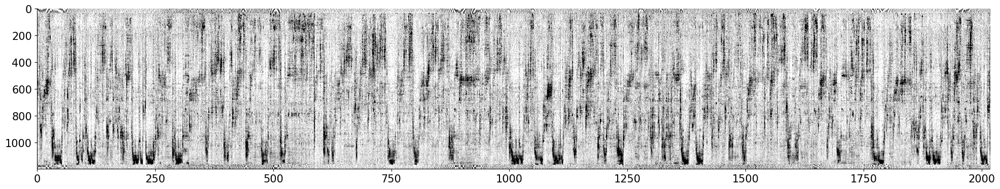

In [27]:
plt.imshow(y_test.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

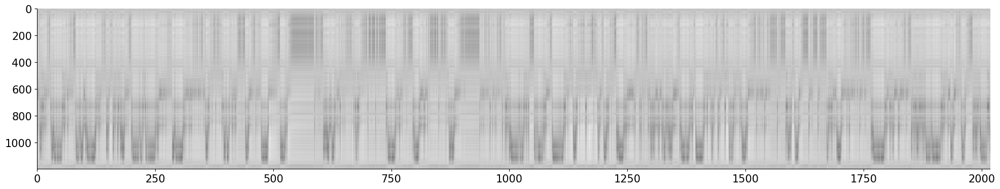

In [28]:
plt.imshow(y_pred.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

In [29]:
# Define the model
model2 = Sequential()
model2.add(Dense(80, activation='tanh', input_shape=(128,), kernel_regularizer=l2(0.01)))
model2.add(Dropout(0.6))
model2.add(Dense(80, activation='tanh', kernel_regularizer=l2(0.01)))
model2.add(Dropout(0.4))
model2.add(Dense(1199, activation='linear'))

# Compile the model
model2.compile(optimizer='adam', loss='mse')

# Print the model summary
model2.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 80)                10320     
                                                                 
 dropout_4 (Dropout)         (None, 80)                0         
                                                                 
 dense_7 (Dense)             (None, 80)                6480      
                                                                 
 dropout_5 (Dropout)         (None, 80)                0         
                                                                 
 dense_8 (Dense)             (None, 1199)              97119     
                                                                 
Total params: 113919 (445.00 KB)
Trainable params: 113919 (445.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/50
125/125 [==============================] - 3s 15ms/step - loss: 1.7005 - val_loss: 1.2362
Epoch 2/50
125/125 [==============================] - 1s 5ms/step - loss: 0.9789 - val_loss: 1.0348
Epoch 3/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8806 - val_loss: 0.9956
Epoch 4/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8644 - val_loss: 0.9887
Epoch 5/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8560 - val_loss: 0.9777
Epoch 6/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8543 - val_loss: 0.9812
Epoch 7/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8524 - val_loss: 0.9660
Epoch 8/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8508 - val_loss: 0.9676
Epoch 9/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8509 - val_loss: 0.9619
Epoch 10/50
125/125 [==============================] - 1s 5ms/step - loss: 0.8455 - val_loss: 0.968

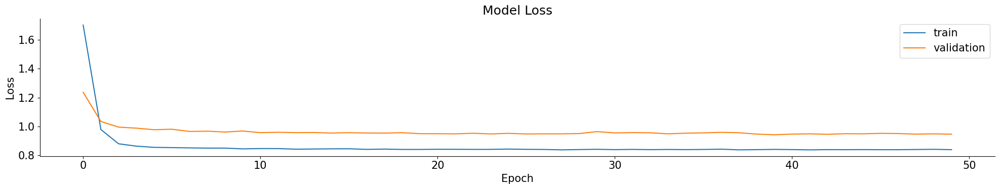

In [30]:
history = model2.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=32)

# Plot the loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()



In [31]:
y_pred = model2.predict(x_test)

y_train_pred = model2.predict(x_train)

157/157 [==============================] - 0s 2ms/step


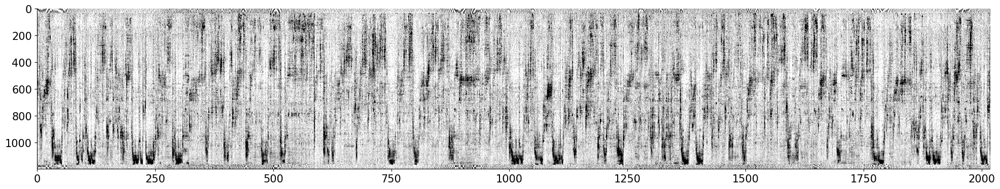

In [32]:
plt.imshow(y_test.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

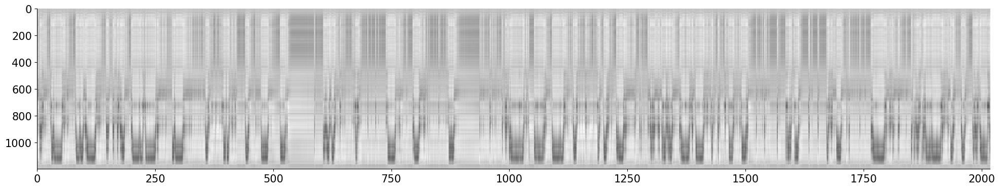

In [33]:
plt.imshow(y_pred.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

In [50]:
# Define the model
model3 = Sequential()
model3.add(Dense(60, activation='linear', input_shape=(128,), kernel_regularizer=l2(0.01)))
model3.add(Dropout(0.2))
model3.add(Dense(60, activation='linear', kernel_regularizer=l2(0.01)))
model3.add(Dropout(0.2))
model3.add(Dense(1199, activation='linear'))

# Compile the model
model3.compile(optimizer='adam', loss='mse')

# Print the model summary
model3.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 60)                7740      
                                                                 
 dropout_8 (Dropout)         (None, 60)                0         
                                                                 
 dense_13 (Dense)            (None, 60)                3660      
                                                                 
 dropout_9 (Dropout)         (None, 60)                0         
                                                                 
 dense_14 (Dense)            (None, 1199)              73139     
                                                                 
Total params: 84539 (330.23 KB)
Trainable params: 84539 (330.23 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/50
125/125 [==============================] - 4s 11ms/step - loss: 575.7055 - val_loss: 38.4225
Epoch 2/50
125/125 [==============================] - 1s 9ms/step - loss: 64.9907 - val_loss: 12.6352
Epoch 3/50
125/125 [==============================] - 1s 7ms/step - loss: 27.1610 - val_loss: 6.6098
Epoch 4/50
125/125 [==============================] - 1s 8ms/step - loss: 15.2402 - val_loss: 4.4063
Epoch 5/50
125/125 [==============================] - 1s 9ms/step - loss: 9.9669 - val_loss: 3.3939
Epoch 6/50
125/125 [==============================] - 1s 7ms/step - loss: 7.1518 - val_loss: 2.8491
Epoch 7/50
125/125 [==============================] - 1s 6ms/step - loss: 5.5300 - val_loss: 2.5512
Epoch 8/50
125/125 [==============================] - 1s 6ms/step - loss: 4.4255 - val_loss: 2.3683
Epoch 9/50
125/125 [==============================] - 1s 6ms/step - loss: 3.7359 - val_loss: 2.2384
Epoch 10/50
125/125 [==============================] - 1s 5ms/step - loss: 3.2090 - val_loss

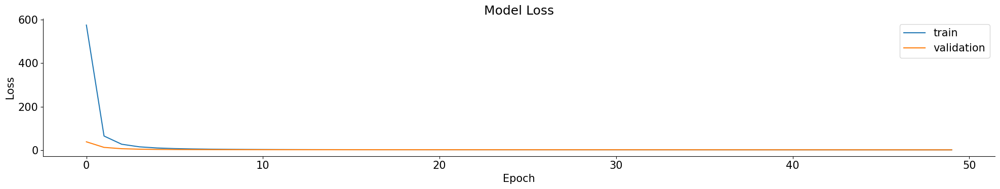

In [51]:
history = model3.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=32)

# Plot the loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()



In [52]:
y_pred = model3.predict(x_test)

y_train_pred = model3.predict(x_train)

157/157 [==============================] - 0s 3ms/step


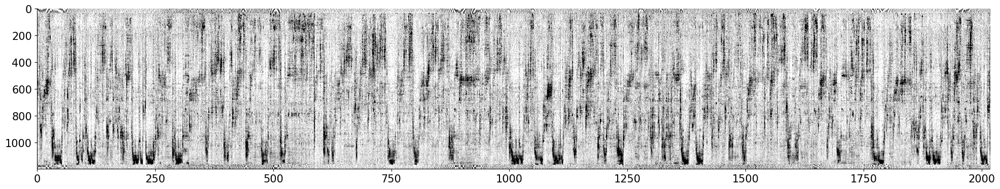

In [53]:
plt.imshow(y_test.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

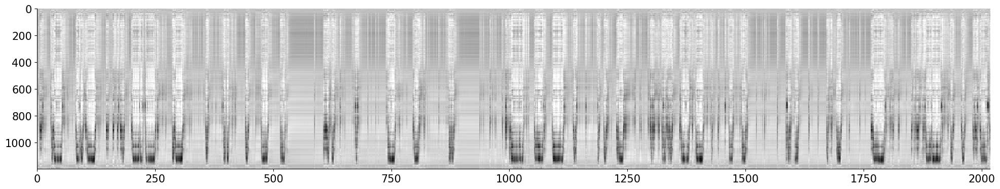

In [54]:
plt.imshow(y_pred.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

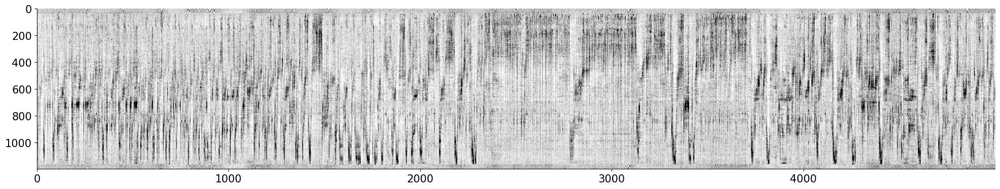

In [55]:
plt.imshow(y_train.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

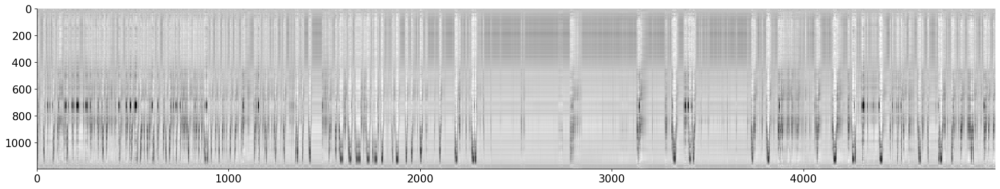

In [56]:
plt.imshow(y_train_pred.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import mean_squared_error, r2_score


# Create the Ridge regression model
ridge = Ridge(alpha=0.1, random_state=42)

# Fit the model
ridge.fit(x_train, y_train)

# Make predictions on the test set
y_pred = ridge.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Coefficient of Determination (R^2):", r2)


Mean Squared Error (MSE): 0.8980781949298041
Coefficient of Determination (R^2): 0.13039518636437855


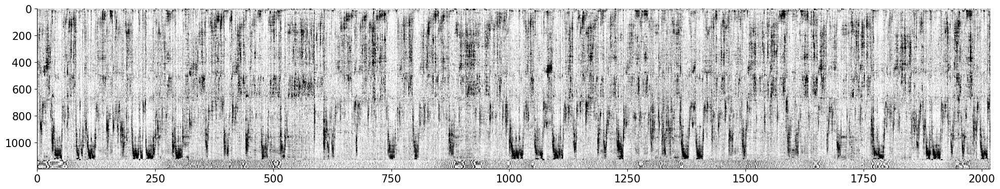

In [ ]:
plt.imshow(y_test.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

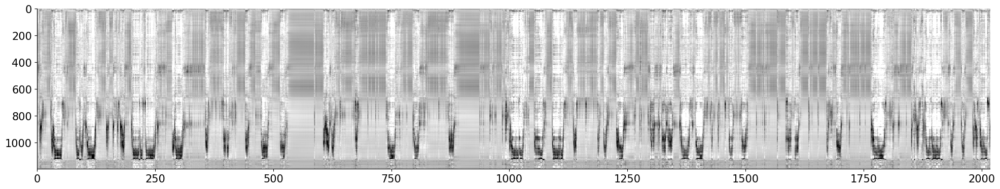

In [ ]:
plt.imshow(y_pred.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

In [42]:
neural_pc = RasterMap.T
motion_energy = dat['beh_svd_time'][:,:256]

print(neural_pc.shape)
print(motion_energy.shape)

trange = np.arange(0, 5000)
y_train = neural_pc[trange,:]
x_train = motion_energy[trange,:]
trange = np.arange(5000, 7018)
y_test = neural_pc[trange,:]
x_test = motion_energy[trange,:]


(7018, 1199)
(7018, 256)


In [43]:
print(x_train.shape)
print(y_test.shape)


(5000, 256)
(2018, 1199)


In [44]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

## lasso regression
lasso = linear_model.Lasso(alpha=0.1)

##Fit the model
lasso.fit(x_train, y_train)

# Make predictions on the test set
y_pred = lasso.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Coefficient of Determination (R^2):", r2)


Mean Squared Error (MSE): 0.8873316189717965
Coefficient of Determination (R^2): 0.1262174494685922


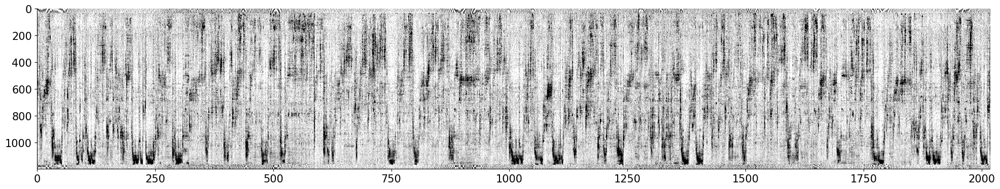

In [45]:
plt.imshow(y_test.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

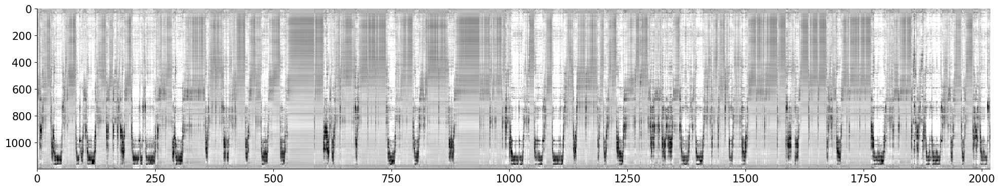

In [46]:
plt.imshow(y_pred.T, vmax= 3, vmin=-1, aspect='auto', cmap='gray_r')
ax.set(xlabel='timepoints', ylabel='sorted neurons')
plt.show()

In [ ]:
# now sort with UMAP both the neuron axis and the timepoints axis, bin the sorted matrix and make a sorted Rastermap picture